In [1]:
import pandas as pd
from sklearn.decomposition import PCA
from scipy.linalg import norm
import plotly_express as px

In [2]:
TFIDF = pd.read_csv('../FinalProject/TFIDF.csv', index_col = ['doc_source', 'doc_id'])

In [12]:
VOCAB = pd.read_csv('../FinalProject/VOCAB2.csv', index_col='term_id')

In [3]:
#normalize vector length
TFIDF = TFIDF.apply(lambda x: x / norm(x), 1)

In [8]:
TFIDF.head()

247       378  432  439  472       481       536  578  \
doc_source doc_id                                                               
Daily Kos  96      0.024498  0.000000  0.0  0.0  0.0  0.000000  0.095151  0.0   
           97      0.000000  0.000000  0.0  0.0  0.0  0.032062  0.000000  0.0   
           98      0.000000  0.032509  0.0  0.0  0.0  0.000000  0.000000  0.0   
           99      0.000000  0.000000  0.0  0.0  0.0  0.000000  0.000000  0.0   
           100     0.000000  0.000000  0.0  0.0  0.0  0.000000  0.000000  0.0   

                   581  646  ...  178968  179044  179084  179105  179171  \
doc_source doc_id            ...                                           
Daily Kos  96      0.0  0.0  ...     0.0     0.0     0.0     0.0     0.0   
           97      0.0  0.0  ...     0.0     0.0     0.0     0.0     0.0   
           98      0.0  0.0  ...     0.0     0.0     0.0     0.0     0.0   
           99      0.0  0.0  ...     0.0     0.0     0.0     0.0     0.0   
           100     0.0  0.0  ...     0.0     0.0     0.0     0.0     0.0   

                   179180  179185  179191  179253  179517  
doc_source doc_id                                          
Daily Kos  96         0.0     0.0     0.0     0.0     0.0  
           97         0.0     0.0     0.0     0.0     0.0  
           98         0.0     0.0     0.0     0.0     0.0  
           99         0.0     0.0     0.0     0.0     0.0  
           100        0.0     0.0     0.0     0.0     0.0  

[5 rows x 14229 columns]

In [9]:
TFIDF.T

doc_source Daily Kos                                                    \
doc_id       96      97        98      99      100     101     102       
247         0.024498     0.0  0.000000     0.0     0.0     0.0     0.0   
378         0.000000     0.0  0.032509     0.0     0.0     0.0     0.0   
432         0.000000     0.0  0.000000     0.0     0.0     0.0     0.0   
439         0.000000     0.0  0.000000     0.0     0.0     0.0     0.0   
472         0.000000     0.0  0.000000     0.0     0.0     0.0     0.0   
...              ...     ...       ...     ...     ...     ...     ...   
179180      0.000000     0.0  0.000000     0.0     0.0     0.0     0.0   
179185      0.000000     0.0  0.000000     0.0     0.0     0.0     0.0   
179191      0.000000     0.0  0.000000     0.0     0.0     0.0     0.0   
179253      0.000000     0.0  0.000000     0.0     0.0     0.0     0.0   
179517      0.000000     0.0  0.000000     0.0     0.0     0.0     0.0   

doc_source                          ... PowerLine                          \
doc_id     104     106     108      ...   1025827 1025828 1026033 1026034   
247            0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
378            0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
432            0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
439            0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
472            0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
...            ...     ...     ...  ...       ...     ...     ...     ...   
179180         0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
179185         0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
179191         0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
179253         0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   
179517         0.0     0.0     0.0  ...       0.0     0.0     0.0     0.0   

doc_source                                                  
doc_id     1026035 1026329 1026330 1026331 1026332 1026333  
247            0.0     0.0     0.0     0.0     0.0     0.0  
378            0.0     0.0     0.0     0.0     0.0     0.0  
432            0.0     0.0     0.0     0.0     0.0     0.0  
439            0.0     0.0     0.0     0.0     0.0     0.0  
472            0.0     0.0     0.0     0.0     0.0     0.0  
...            ...     ...     ...     ...     ...     ...  
179180         0.0     0.0     0.0     0.0     0.0     0.0  
179185         0.0     0.0     0.0     0.0     0.0     0.0  
179191         0.0     0.0     0.0     0.0     0.0     0.0  
179253         0.0     0.0     0.0     0.0     0.0     0.0  
179517         0.0     0.0     0.0     0.0     0.0     0.0  

[14229 rows x 24868 columns]

In [4]:
pca = PCA(n_components=10)

In [5]:
DCM = pd.DataFrame(pca.fit_transform(TFIDF), index=TFIDF.index)
DCM.columns = [f'PC{i}' for i in DCM.columns]

In [6]:
DCM

PC0       PC1       PC2       PC3       PC4  \
doc_source doc_id                                                      
Daily Kos  96       0.074571 -0.094762 -0.020632  0.093494 -0.030524   
           97       0.079110  0.030999 -0.037342 -0.038153 -0.039801   
           98       0.091431 -0.051039 -0.042191  0.005142  0.010056   
           99      -0.003013 -0.017364  0.045040 -0.032506  0.006433   
           100     -0.071367 -0.028012 -0.043379  0.000451 -0.008270   
...                      ...       ...       ...       ...       ...   
PowerLine  1026329 -0.021948 -0.021325 -0.025668 -0.050352  0.001616   
           1026330 -0.016147  0.016221  0.006962  0.024805 -0.104818   
           1026331 -0.020083 -0.005676 -0.029318  0.000628  0.000340   
           1026332 -0.055528 -0.004767  0.012122  0.031682 -0.097179   
           1026333 -0.036344  0.000618 -0.050770 -0.010404 -0.027751   

                         PC5       PC6       PC7       PC8       PC9  
doc_source doc_id                                                     
Daily Kos  96       0.024162  0.019928 -0.000378  0.075583 -0.049116  
           97       0.009473 -0.074190 -0.022863 -0.000940  0.011308  
           98       0.019023 -0.023902 -0.022534  0.024125 -0.029872  
           99      -0.023506  0.007367 -0.021867 -0.039449  0.013639  
           100      0.014190  0.050694 -0.017372 -0.002275 -0.013860  
...                      ...       ...       ...       ...       ...  
PowerLine  1026329 -0.053060  0.022283  0.016247  0.073508 -0.043131  
           1026330  0.016491 -0.048468  0.110124  0.075797 -0.011712  
           1026331 -0.014921  0.044835 -0.001557 -0.010659 -0.016377  
           1026332  0.059413 -0.039251  0.080357  0.002523  0.014806  
           1026333 -0.015788 -0.010374  0.004698  0.002570 -0.031293  

[24868 rows x 10 columns]

In [24]:
LOADINGS = pd.DataFrame(pca.components_.T, index=TFIDF.T.index, columns=DCM.columns)

In [25]:
LOADINGS['term_str'] = loadings.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)

In [26]:
LOADINGS

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,term_str
247,0.022388,-0.029763,0.001057,0.004569,-0.012960,0.041695,0.021254,-0.025845,0.010497,-0.013496,1
378,0.020738,-0.011291,0.006009,-0.022277,0.000142,0.035601,0.007520,-0.007276,-0.007768,-0.000481,11
432,0.001716,-0.001379,-0.001123,-0.000692,-0.001194,0.005117,0.002818,-0.004420,0.002058,-0.001785,115
439,0.002809,-0.001345,0.000389,-0.002454,-0.001241,0.002403,0.000727,-0.001869,-0.000720,0.000563,116
472,0.005311,-0.003061,0.004798,-0.007083,-0.002611,0.003044,0.000979,-0.000811,-0.002979,0.001835,11th
...,...,...,...,...,...,...,...,...,...,...,...
179180,0.007409,0.002812,-0.009896,-0.002167,0.001341,0.001474,0.007889,-0.001011,-0.006553,0.001686,zone
179185,0.005349,0.001062,-0.006200,0.001995,-0.001970,0.003154,0.001847,0.003130,-0.003492,0.001811,zones
179191,0.002640,-0.000396,-0.002507,0.001168,-0.001448,0.002339,-0.000717,-0.000351,0.001620,0.000377,zoning
179253,0.001191,0.000630,-0.002162,-0.000794,0.002558,0.001643,-0.000888,0.001291,0.002745,-0.000371,zuckerberg


In [27]:
lb0_pos = LOADINGS.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
lb0_neg = LOADINGS.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
lb1_pos = LOADINGS.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')
lb1_neg = LOADINGS.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')

In [28]:
print('Articles PC0+', lb0_pos)
print('Articles PC0-', lb0_neg)
print('Articles PC1+', lb1_pos)
print('Articles PC1-', lb1_neg)

Books PC0+ pic yesterday https video posted fbi comey investigation subscription collusion
Books PC0- newsletters recaptcha unsubscribe inbox alerts privacy signing google protected receive
Books PC1+ obamacare insurance health trumpcare repeal medicaid care vote 224 3121
Books PC1- fbi investigation russian intelligence russia comey counsel mueller information collusion


In [17]:
def vis_pcs(M, a, b, prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color='doc_source', 
                        hover_name='doc_id', marginal_x='box')
    fig.show()

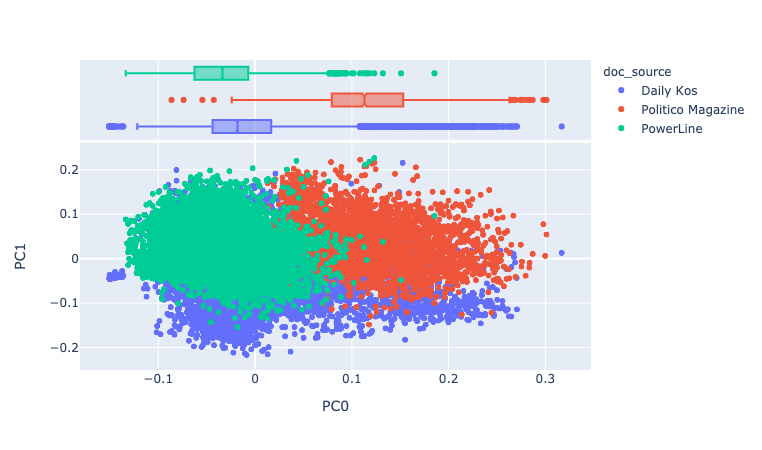

In [20]:
#DCM = DCM.reset_index()
vis_pcs(DCM, 0, 1)

Interesting, there's a clear separation between Politico and Powerline although Daily Kos (explicitly progressive) aligns more with Powerline and is more widely distributed.

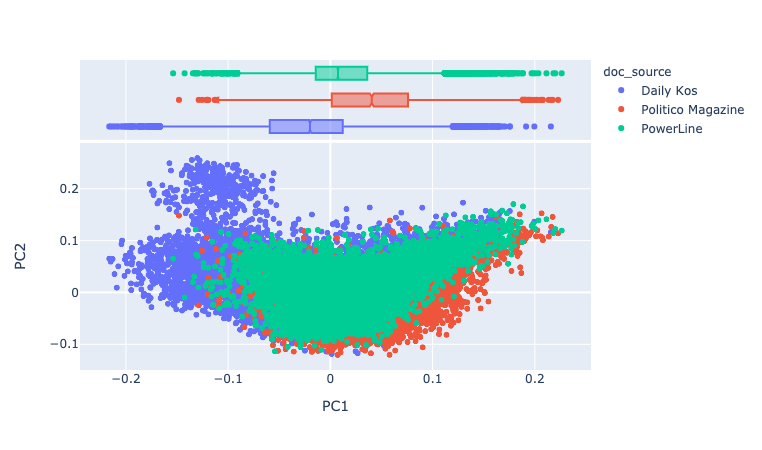

In [21]:
vis_pcs(DCM, 1, 2)

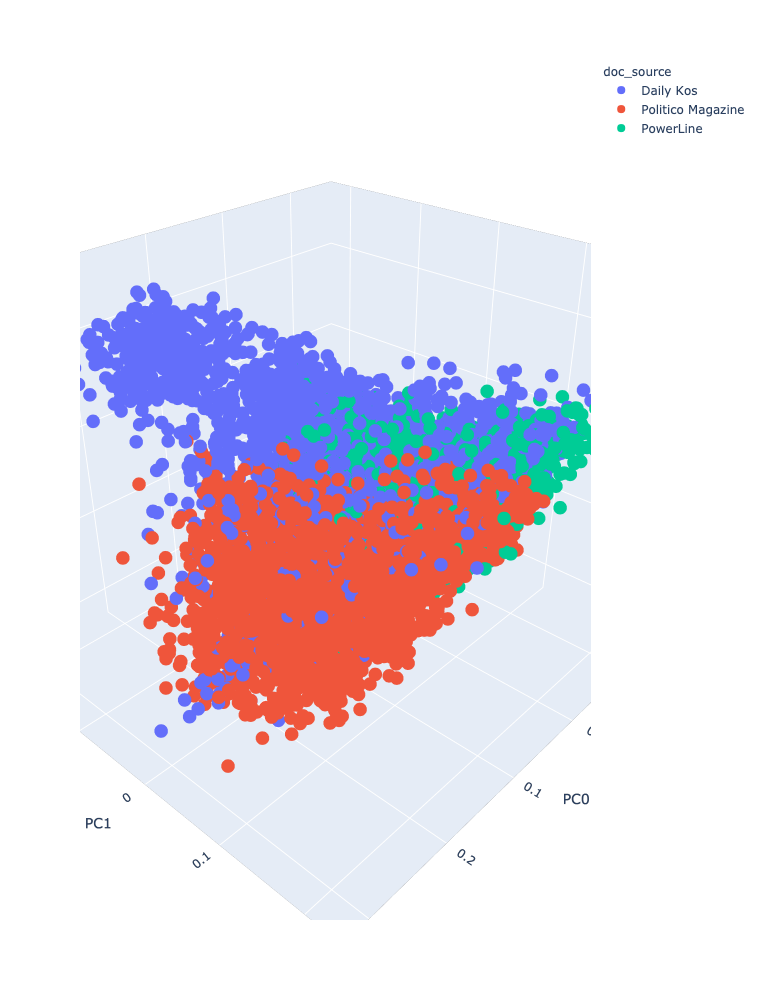

In [22]:
px.scatter_3d(DCM, 'PC0', 'PC1','PC2', color='doc_source', hover_name='doc_id', height=1000, width=1200)